In [64]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="darkgrid")
import warnings
warnings.filterwarnings("ignore")

In [39]:
data=pd.read_csv("/content/drive/MyDrive/heart disease project/archive (2).zip (Unzipped Files)/heart.csv")

In [40]:
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [41]:
data.shape

(303, 14)

In [42]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [43]:
data.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [44]:
data.isnull().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64

In [45]:
pip install dataprep

DataPrep Report
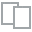
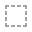
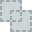
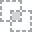
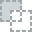
...
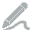
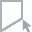
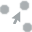
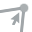
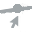

In [46]:
from dataprep.eda import create_report
create_report(data)

In [47]:
x=data.drop(columns="target")
y=data.target

In [48]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

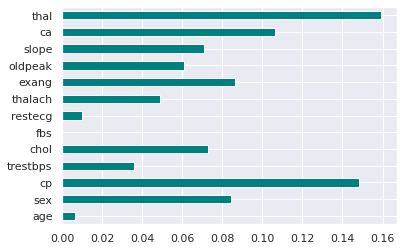

In [49]:
from sklearn.feature_selection import mutual_info_classif
imp=mutual_info_classif(x,y)
feat_imp=pd.Series(imp,data.columns[0:len(data.columns)-1])
feat_imp.plot(kind="barh",color="teal")
plt.show()

,features,imp
5,fbs,0.010483
6,restecg,0.020505
1,sex,0.032634
8,exang,0.054293
10,slope,0.055744
3,trestbps,0.073936
4,chol,0.076212
0,age,0.079193
12,thal,0.098439
11,ca,0.114406


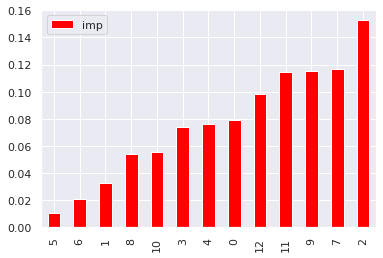

In [50]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(n_estimators=100)
rf.fit(x,y)
importances=rf.feature_importances_
imp=pd.DataFrame({"features":pd.DataFrame(x).columns,"imp":importances})
imp.set_index("imp")
imp=imp.sort_values('imp')
imp.plot.bar(color="red")
imp

In [51]:
columns={"fbs","restecg","sex","slope","exang"}
data=data.drop(columns=columns,axis=1)


In [52]:
data

,age,cp,trestbps,chol,thalach,oldpeak,ca,thal,target
0,63,3,145,233,150,2.3,0,1,1
1,37,2,130,250,187,3.5,0,2,1
2,41,1,130,204,172,1.4,0,2,1
3,56,1,120,236,178,0.8,0,2,1
4,57,0,120,354,163,0.6,0,2,1
...,...,...,...,...,...,...,...,...,...
298,57,0,140,241,123,0.2,0,3,0
299,45,3,110,264,132,1.2,0,3,0
300,68,0,144,193,141,3.4,2,3,0
301,57,0,130,131,115,1.2,1,3,0


In [54]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [60]:
from sklearn.metrics import confusion_matrix,accuracy_score

In [55]:
x_train.shape,y_train.shape,x_test.shape,y_test.shape

((242, 13), (242,), (61, 13), (61,))

In [67]:
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()
clf.fit(x_train,y_train)
prd=clf.predict(x_test)
print(accuracy_score(prd,y_test))
confusion_matrix(prd,y_test)

0.8852459016393442


array([[25,  3],
       [ 4, 29]])

In [75]:
from sklearn.ensemble import RandomForestClassifier
rlf=RandomForestClassifier()
rlf.fit(x_train,y_train)
rprd=rlf.predict(x_test)
print(accuracy_score(rprd,y_test))
confusion_matrix(rprd,y_test)


0.819672131147541


array([[24,  6],
       [ 5, 26]])

In [76]:
from sklearn.tree import DecisionTreeClassifier
dlf=DecisionTreeClassifier()
dlf.fit(x_train,y_train)
dprd=dlf.predict(x_test)
print(accuracy_score(dprd,y_test))
confusion_matrix(dprd,y_test)


0.819672131147541


array([[27,  9],
       [ 2, 23]])

In [80]:
from sklearn.model_selection import GridSearchCV
grid={"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}# l1 lasso l2 ridge
logreg=LogisticRegression()
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(x_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [81]:
print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 0.1, 'penalty': 'l2'}
accuracy : 0.8265


In [85]:
clf=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False)

In [86]:
clf.fit(x_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [87]:
l_pred=clf.predict(x_test)

In [88]:
print(accuracy_score(l_pred,y_test))
confusion_matrix(l_pred,y_test)

0.8852459016393442


array([[25,  3],
       [ 4, 29]])

In [91]:
import pickle
filename = 'finalized_model_lg.sav'
pickle.dump(clf, open(filename, 'wb'))


In [92]:
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(x_test,y_test)
print(result)

0.8852459016393442
